# Introduction

In today's technology-driven world, the significance of recommender systems cannot be overstated. These systems play a crucial role in helping individuals make informed choices about the content they consume on a daily basis. One specific domain where recommender systems are particularly valuable is in the realm of movie content recommendations. With an overwhelming number of options available, intelligent algorithms can assist viewers in discovering outstanding titles that align with their preferences.

Have you ever wondered how streaming platforms like Netflix, Amazon Prime, Showmax, Disney, and others seem to magically know what to recommend to you? Well, it's not just a random guess pulled out of thin air. Behind these personalized recommendations lies a sophisticated algorithm.

# Problem Statement

Considering this context, the contexts of this notebook attempts to develop a recommendation algorithm based on either content or collaborative filtering. The primary objective of this algorithm is to accurately predict how a user will rate a movie they have not yet viewed based on their historical preferences. By leveraging the user's past interactions and preferences, the recommender system should generate reliable predictions of their future movie ratings.

# Value of Building a Functional Recommender System
Constructing an accurate and robust solution to this challenge holds immense economic potential. By creating a recommender system that effectively tailors movie recommendations to individual users, the system can expose them to content they are highly likely to enjoy. This personalized approach can drive increased viewership, purchases, and engagement, thereby generating revenue for the platform. Additionally, a successful recommender system fosters a sense of platform affinity, as users perceive the service as consistently providing them with valuable and enjoyable content recommendations.

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling and Model Performance</a>

<a href=#seven>6. Model Evaluation</a>

<a href=#one>7. Conclusion</a>

<a href=#one>8. References</a>

<a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
| In this section, we will import the libraries that will be used to create experiments on Comet, for our analysis and modelling. |

---

In [2]:
from git import Repo

# Specify the path to the directory where you want to initialize the Git repository
repo_dir = r'C:\Users\Malose Matlakala\Documents\UNSUPERVISED LEARNING\PREDICT\TEAM-ES-2'

# Initialize the Git repository
repo = Repo.init(repo_dir)

# Print the Git repository path
print("Initialized Git repository at:", repo.working_dir)

Initialized Git repository at: /kaggle/working/C:\Users\Malose Matlakala\Documents\UNSUPERVISED LEARNING\PREDICT\TEAM-ES-2


In [3]:
!pip install comet_ml

import comet_ml

# Creating an experiment with your api key

from comet_ml import Experiment
experiment = Experiment(
  api_key = "UVJcHJVJ2SGuzgGBwpfFz6mt8",
  project_name = "recommender-systems",
  workspace="mati9210"
)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.6/549.6 kB 9.4 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 45.1 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.1/510.1 kB 29.7 MB/s eta 0:00:00
  Attempting uninstall: websocket-client
    Found existing installation: websocket-client 1.6.0
    Uninstalling websocket-client-1.6.0:
      Successfully uninstalled websocket-client-1.6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab-lsp 4.2.0 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.


COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/kaggle/working' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/mati9210/recommender-systems/00789137f87d4d3296ff04a1c72c82e8



In [4]:
# import libraries

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from datetime import datetime

# Data Preprocessing
import random
from time import time
import cufflinks as cf
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from sklearn.preprocessing import StandardScaler
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)


# Models
from surprise import Reader, Dataset
from surprise import SVD, NormalPredictor, BaselineOnly, NMF, SlopeOne, CoClustering
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

# Performance Evaluation
from surprise import accuracy
from sklearn.metrics import mean_squared_error
from surprise.model_selection import GridSearchCV, cross_validate, train_test_split

# Display
%matplotlib inline
sns.set(font_scale=1)
sns.set_style("white")
pd.set_option('display.max_columns', 37)

# Ignore warnings
import warnings

warnings.filterwarnings('ignore')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/edsa-movie-recommendation-predict/sample_submission.csv
/kaggle/input/edsa-movie-recommendation-predict/movies.csv
/kaggle/input/edsa-movie-recommendation-predict/imdb_data.csv
/kaggle/input/edsa-movie-recommendation-predict/genome_tags.csv
/kaggle/input/edsa-movie-recommendation-predict/genome_scores.csv
/kaggle/input/edsa-movie-recommendation-predict/train.csv
/kaggle/input/edsa-movie-recommendation-predict/test.csv
/kaggle/input/edsa-movie-recommendation-predict/tags.csv
/kaggle/input/edsa-movie-recommendation-predict/links.csv


<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
| In this section, we will load multiple datasets. |

---

In [5]:
# load cvs files
train = pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/train.csv')
test = pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/test.csv')
tags = pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/tags.csv')
movies = pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/movies.csv')
links = pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/links.csv')
imdb_data = pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/imdb_data.csv')
genome_tags = pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/genome_tags.csv')
genome_scores = pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/genome_scores.csv')


# pre-preprocessing to load the data from each file into a DataFrame
# and utilize the specified index column for easier data retrieval and manipulation.

movies_df =  pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/movies.csv', index_col='movieId')
imdb_df =  pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/imdb_data.csv', index_col='movieId')
links_df =  pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/links.csv', index_col='movieId')
genome_scores_df =  pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/genome_scores.csv', index_col='movieId')
genome_tags_df =  pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/genome_tags.csv', index_col='tagId')
tags_df =  pd.read_csv('/kaggle/input/edsa-movie-recommendation-predict/tags.csv')

### Read the CSV file

In [6]:
train.head()

,userId,movieId,rating,timestamp
0,5163,57669,4.0,1518349992
1,106343,5,4.5,1206238739
2,146790,5459,5.0,1076215539
3,106362,32296,2.0,1423042565
4,9041,366,3.0,833375837


In [7]:
test.head()

,userId,movieId
0,1,2011
1,1,4144
2,1,5767
3,1,6711
4,1,7318


In [8]:
tags.head()

,userId,movieId,tag,timestamp
0,3,260,classic,1439472355
1,3,260,sci-fi,1439472256
2,4,1732,dark comedy,1573943598
3,4,1732,great dialogue,1573943604
4,4,7569,so bad it's good,1573943455


In [9]:
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [10]:
links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [11]:
imdb_data.head()

,movieId,title_cast,director,runtime,budget,plot_keywords
0,1,Tom Hanks|Tim Allen|Don Rickles|Jim Varney|Wal...,John Lasseter,81.0,"$30,000,000",toy|rivalry|cowboy|cgi animation
1,2,Robin Williams|Jonathan Hyde|Kirsten Dunst|Bra...,Jonathan Hensleigh,104.0,"$65,000,000",board game|adventurer|fight|game
2,3,Walter Matthau|Jack Lemmon|Sophia Loren|Ann-Ma...,Mark Steven Johnson,101.0,"$25,000,000",boat|lake|neighbor|rivalry
3,4,Whitney Houston|Angela Bassett|Loretta Devine|...,Terry McMillan,124.0,"$16,000,000",black american|husband wife relationship|betra...
4,5,Steve Martin|Diane Keaton|Martin Short|Kimberl...,Albert Hackett,106.0,"$30,000,000",fatherhood|doberman|dog|mansion


In [12]:
genome_tags.head()

,tagId,tag
0,1,007
1,2,007 (series)
2,3,18th century
3,4,1920s
4,5,1930s


In [13]:
genome_scores.head()

,movieId,tagId,relevance
0,1,1,0.02875
1,1,2,0.02375
2,1,3,0.06250
3,1,4,0.07575
4,1,5,0.14075


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
| In this section, we will perform an in-depth analysis of the variables in the different DataFrames. |

---


### Convert the timestamps into datetime

In [14]:
# convert timestamp to datetime
# Convert timestamp column to datetime in the train dataframe
train.loc[:, 'timestamp'] = pd.to_datetime(train['timestamp'], unit='s')

# Convert timestamp column to datetime in the tags dataframe
tags.loc[:, 'timestamp'] = pd.to_datetime(tags['timestamp'], unit='s')

### Select two  datasets, merge them, and analyse the structure of the new dataset.

* There are two dataframes that we believe have the contents that are mostly required to make recommender predictions.
* The two dataframes are the train and movies.
* They contain information such as ratings, genre, movie title, as well as user ID.

In [15]:
# merge the train and movies dataframes
new_df = pd.merge(left = movies, right = train, on = 'movieId')

In [16]:
# display the new dataframe
new_df.head()

,movieId,title,genres,userId,rating,timestamp
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,158849,5.0,2001-07-09 22:13:06
1,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,97203,5.0,1999-11-15 16:25:55
2,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,161871,3.0,1996-05-26 09:56:16
3,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,45117,4.0,2015-09-14 18:56:09
4,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,27431,5.0,1996-12-04 02:50:27


In [17]:
new_df.tail()

,movieId,title,genres,userId,rating,timestamp
10000033,209145,Liberté (2019),Drama,145795,1.0,2019-11-20 04:49:22
10000034,209153,Happy Flight (2008),Comedy|Drama,147040,2.5,2019-11-20 06:51:44
10000035,209159,Window of the Soul (2001),Documentary,115835,3.0,2019-11-20 20:16:25
10000036,209169,A Girl Thing (2001),(no genres listed),119571,3.0,2019-11-20 23:17:06
10000037,209171,Women of Devil's Island (1962),Action|Adventure|Drama,119571,3.0,2019-11-20 23:18:57


* The new dataframe contains features that mainly influence rating.

### Check for missing values

In [18]:
# check for null values
new_df.isnull().sum()

movieId      0
title        0
genres       0
userId       0
rating       0
timestamp    0
dtype: int64

* There are no missing values in this new dataset.

### Check for duplicates

In [19]:
# check for any duplicated entries
new_df.duplicated()

0           False
1           False
2           False
3           False
4           False
            ...  
10000033    False
10000034    False
10000035    False
10000036    False
10000037    False
Length: 10000038, dtype: bool

* There are also no duplicates found.

 ### Analyse the shape of the dataframe

In [20]:
# shape of the dataframe - how many rows and columns?
new_df.shape

(10000038, 6)

* There are over 10 million entries and only six columns.
* There are a lot of movies and each user watches as many movies and therefore rates as much at different times.

In [21]:
# how many movies are there in the dataframe?
new_df['movieId'].nunique()

48213

* There are over 48 thousand unique movies in total, which will be enough to make good predictions and draw some valuable conclusions. 

In [22]:
# how many users are there in the dataframe?
new_df['userId'].nunique()

162541

* There are 160K unique users, and each user rates different movies, which explains the many entries we have in the dataset.

In [23]:
# how many genres?
new_df['genres'].nunique()

1558

### Explore the years the movies were published.

* The code in the cell below attempts to extract the publication years stored in the title brackets.
* If successful, the years will be stored in a new column called PubYear.
* Some titles don't have publication years, therefore the missing years will be replaced with the number 9999.

In [24]:
# explore years the movies were published

pub_years = []  # create an empty list to store the extracted years

# Iterate over the titles in the dataset
for title in new_df['title']:
    year_subset = title[-5:-1]  # Extract the last four characters from the title
    
    if year_subset.isdigit():  # Check if the year subset consists of only digits
        pub_years.append(int(year_subset))  # Convert the extracted subset to an integer and add it to the pub_years list
    else:
        pub_years.append(9999)  # If the year subset cannot be converted to an integer, add 9999 to represent an unknown year

new_df['PubYear'] = pub_years  # Create a new column 'PubYear' in the dataset and assign the extracted years
unknown_years_count = len(new_df[new_df['PubYear'] == 9999])  # Count the movies with an unknown publication year

print(unknown_years_count)  # Print the count of movies with an unknown publication year

5367


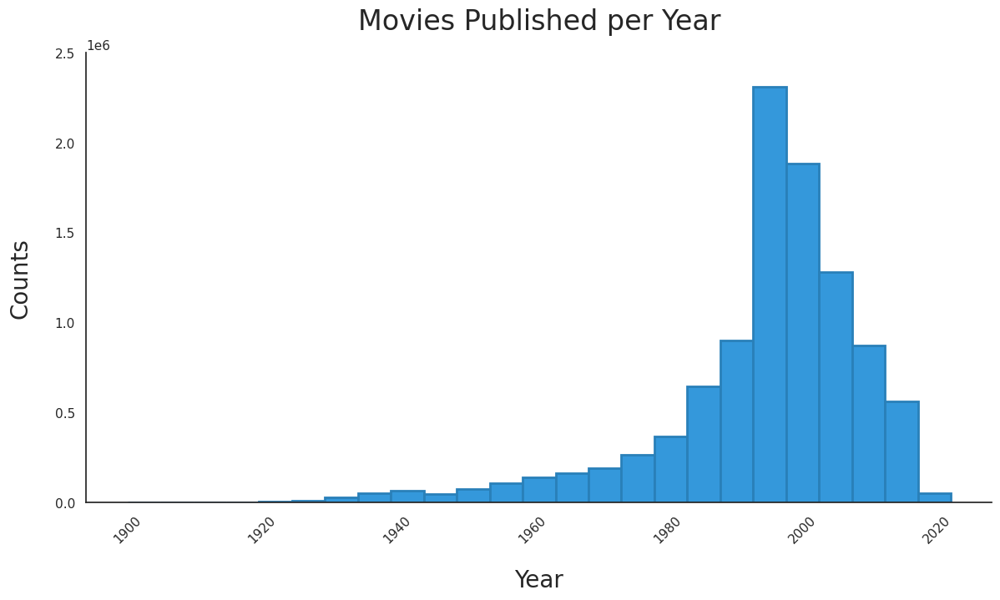

In [25]:
# plot a histogram to illustrate the publication years
def make_histogram(data, attribute, bins=25, bar_color='#3498db', edge_color='#2980b9', title='Title', xlab='X', ylab='Y', sort_index=False):
    if attribute == 'PubYear':
        data = data[data['PubYear'] != 9999]
        
    fig, ax = plt.subplots(figsize=(14, 7))
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_title(title, fontsize=24, pad=20)
    ax.set_xlabel(xlab, fontsize=20, labelpad=20)
    ax.set_ylabel(ylab, fontsize=20, labelpad=20)
    
    # Set the range for x-axis (years) and y-axis (counts)
    plt.hist(data[attribute], bins=bins, range=(1900, 2022), color=bar_color, edgecolor=edge_color, linewidth=2)
    plt.ylim(0, 2500000)  # Set the y-axis limits
    
    plt.xticks(rotation=45)
    
make_histogram(new_df, 'PubYear', title='Movies Published per Year', xlab='Year', ylab='Counts')

* Most movies were released between 1995 and 2000.
* We can relate this to these factors:
    1. Technological advancements.
    2. Cultural and social factors, such as the rise of blockbuster franchises.
    3. Globalisation of the film industry.

### Explore the ratings

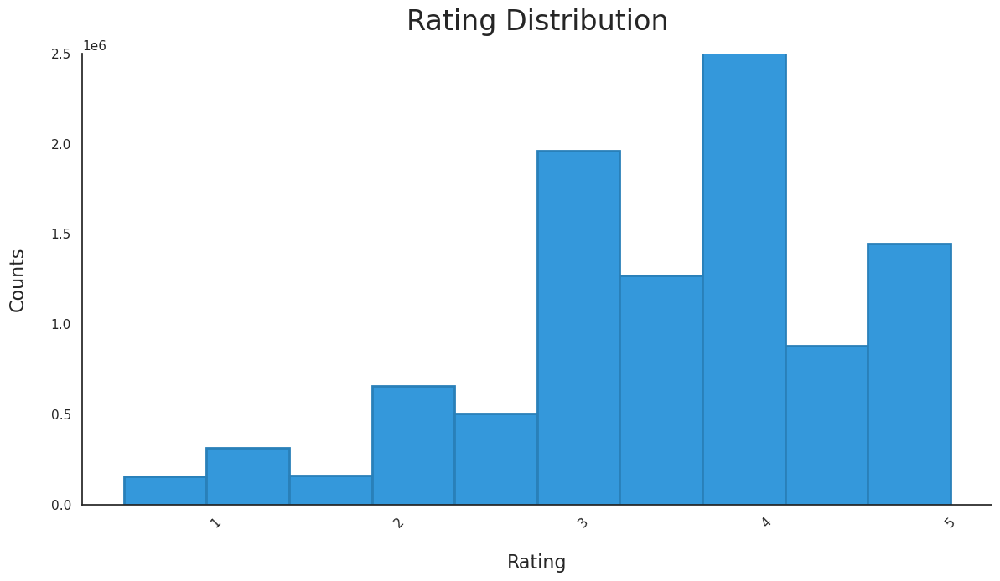

In [26]:
# plot a histogram to illustrate the distribution of ratings
def rating_histogram(data, attribute, bins=10, bar_color='#3498db', edge_color='#2980b9', title='Title', xlab='X', ylab='Y', sort_index=False):
    fig, ax = plt.subplots(figsize=(14, 7))
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_title(title, fontsize=24, pad=20)
    ax.set_xlabel(xlab, fontsize=16, labelpad=20)
    ax.set_ylabel(ylab, fontsize=16, labelpad=20)

    # Set the range for x-axis (ratings) and y-axis (counts)
    plt.hist(data[attribute], bins=bins, color=bar_color, edgecolor=edge_color, linewidth=2)
    plt.ylim(0, 2500000)  # Set the y-axis limits
    
    plt.xticks(rotation=45)

# Call the rating_histogram function
rating_histogram(new_df, 'rating', title='Rating Distribution', xlab='Rating', ylab='Counts')

* Most users give a rating of 4 stars, followed by 3 then 5.
* It is also evident that users are more likely to give a 5 star rating than a 0.5.

#### - Top ten movies by number of ratings

In [27]:
# create a new dataframe that groups movie IDs
num_ratings = pd.DataFrame(new_df.groupby('movieId').count()['rating']).reset_index()

# merge the dataframe above with the original dataframe
new_df = pd.merge(left=new_df, right=num_ratings, on='movieId')

# rename the columns
new_df.rename(columns={'rating_x': 'rating', 'rating_y': 'numRatings'}, inplace=True)

In [28]:
new_df.rename(columns={'numRatings': 'uniqueNumRatings'}, inplace=True)

In [29]:
new_df.sort_values(by='uniqueNumRatings', ascending=False).drop_duplicates('movieId')[:10]

,movieId,title,genres,userId,rating,timestamp,PubYear,uniqueNumRatings
885343,318,"Shawshank Redemption, The (1994)",Crime|Drama,122940,5.0,2015-02-22 05:28:40,1994,32831
1007559,356,Forrest Gump (1994),Comedy|Drama|Romance|War,51894,4.0,1996-09-30 23:18:36,1994,32383
804847,296,Pulp Fiction (1994),Comedy|Crime|Drama|Thriller,7823,3.5,2004-12-23 22:56:56,1994,31697
1616591,593,"Silence of the Lambs, The (1991)",Crime|Horror|Thriller,69176,4.0,2018-08-12 14:27:05,1991,29444
4549925,2571,"Matrix, The (1999)",Action|Sci-Fi|Thriller,157864,4.0,2009-09-25 13:11:45,1999,29014
691538,260,Star Wars: Episode IV - A New Hope (1977),Action|Adventure|Sci-Fi,30865,5.0,1996-11-25 15:19:38,1977,27560
1305762,480,Jurassic Park (1993),Action|Adventure|Sci-Fi|Thriller,123298,4.0,1996-05-22 12:50:20,1993,25518
1412657,527,Schindler's List (1993),Drama|War,115661,4.0,2016-10-22 14:39:01,1993,24004
350081,110,Braveheart (1995),Action|Drama|War,1173,4.0,2002-07-29 12:44:05,1995,23722
5019484,2959,Fight Club (1999),Action|Crime|Drama|Thriller,26958,4.5,2018-02-11 05:40:24,1999,23536


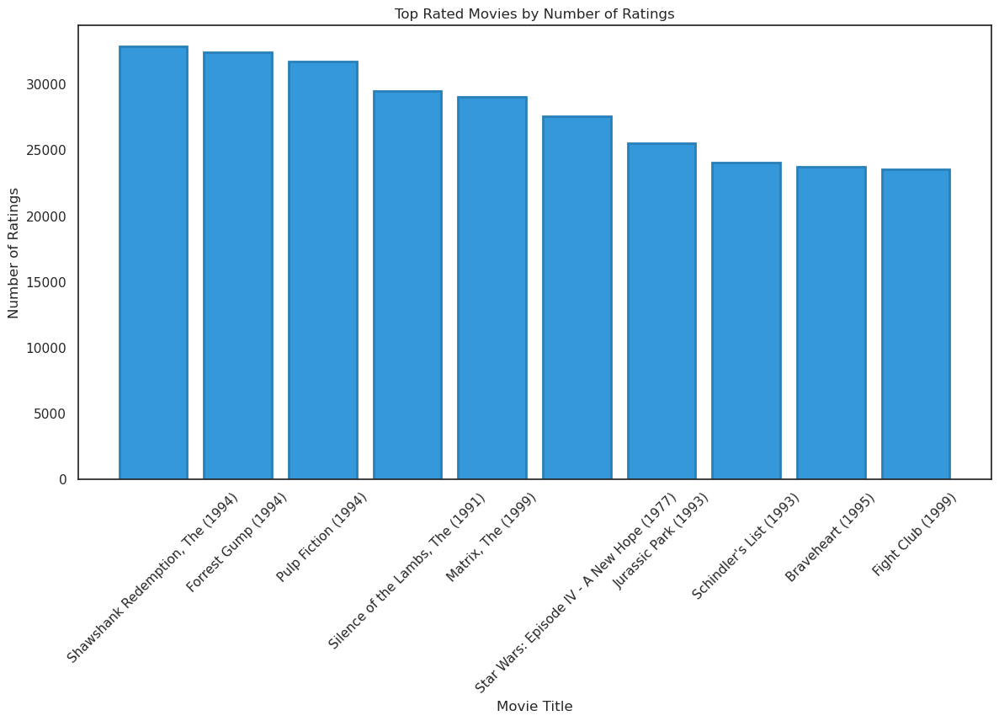

In [30]:
# Get the top rated movies based on the number of ratings
top_movies = new_df.drop_duplicates(subset='title').nlargest(10, 'uniqueNumRatings')

# Create a bar chart to visualize the top rated movies
plt.figure(figsize=(14, 7))
plt.bar(top_movies['title'], top_movies['uniqueNumRatings'], color='#3498db', edgecolor='#2980b9', linewidth=2)

plt.title('Top Rated Movies by Number of Ratings')
plt.xlabel('Movie Title')
plt.ylabel('Number of Ratings')

plt.xticks(rotation=45)
plt.show()

In [31]:
top_movies

,movieId,title,genres,userId,rating,timestamp,PubYear,uniqueNumRatings
852739,318,"Shawshank Redemption, The (1994)",Crime|Drama,9512,4.0,2005-04-09 05:36:41,1994,32831
985934,356,Forrest Gump (1994),Comedy|Drama|Romance|War,138662,3.0,2018-04-06 06:03:14,1994,32383
774279,296,Pulp Fiction (1994),Comedy|Crime|Drama|Thriller,121814,5.0,1999-10-30 18:42:55,1994,31697
1606774,593,"Silence of the Lambs, The (1991)",Crime|Horror|Thriller,158323,5.0,1998-04-21 18:22:44,1991,29444
4545041,2571,"Matrix, The (1999)",Action|Sci-Fi|Thriller,102843,3.0,2014-11-23 20:27:20,1999,29014
671279,260,Star Wars: Episode IV - A New Hope (1977),Action|Adventure|Sci-Fi,147944,4.0,1997-11-13 09:23:43,1977,27560
1281815,480,Jurassic Park (1993),Action|Adventure|Sci-Fi|Thriller,8022,3.0,2000-07-20 17:15:38,1993,25518
1389718,527,Schindler's List (1993),Drama|War,10218,5.0,2015-03-08 18:17:03,1993,24004
336547,110,Braveheart (1995),Action|Drama|War,159841,4.0,1999-12-13 03:28:39,1995,23722
5017962,2959,Fight Club (1999),Action|Crime|Drama|Thriller,134493,4.0,2011-04-03 23:06:24,1999,23536


* Shawshank Redemption got the most ratings.
* These 10 movies are considered iconic in the film industry. They have become part of popular culture and are often referenced or discussed in everyday conversations.

#### - Top Rated Directors

In [32]:
# Select specific columns from IMDb DataFrame
imdb_selected_cols = imdb_data[['movieId', 'director', 'budget']]

# Merge the selected columns and new_df DataFrames
merged_df = pd.merge(imdb_selected_cols, new_df, on='movieId')

# Group by director and count the number of ratings
director_ratings = merged_df.groupby('director').agg({'rating': 'count', 'budget': 'first'}).reset_index()

# Sort the directors by the number of ratings in descending order
director_ratings_sorted = director_ratings.sort_values(by='rating', ascending=False)

# Select the top 10 directors with the most number of ratings
top_10_directors = director_ratings_sorted.head(15)

top_10_directors

,director,rating,budget
7572,Quentin Tarantino,109919,"$34,000,000"
6385,Michael Crichton,65157,"$50,000,000"
3762,J.R.R. Tolkien,62963,"$93,000,000"
5652,Lilly Wachowski,60988,"$50,000,000"
8770,Stephen King,59903,"$25,000,000"
2811,Ethan Coen,51185,"$40,000,000"
3856,James Cameron,51178,"$42,000,000"
5732,Luc Besson,44015,"FRF115,000,000"
4779,Jonathan Nolan,42645,"$40,000,000"
9181,Thomas Harris,36425,"$19,000,000"


* Analysing the information above, we cannot certainly conclude that budget has a direct impact on ratings.

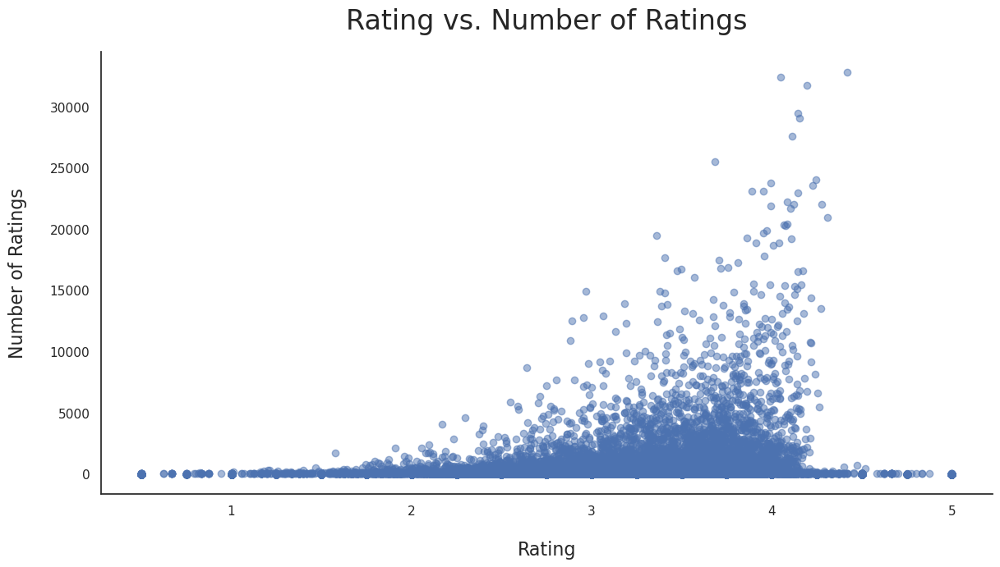

In [33]:
ratings_df = pd.DataFrame()
ratings_df['Mean_Rating'] = new_df.groupby('title')['rating'].mean().values
ratings_df['Num_Ratings'] = new_df.groupby('title')['rating'].count().values


fig, ax = plt.subplots(figsize=(14, 7))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Rating vs. Number of Ratings', fontsize=24, pad=20)
ax.set_xlabel('Rating', fontsize=16, labelpad=20)
ax.set_ylabel('Number of Ratings', fontsize=16, labelpad=20)

plt.scatter(ratings_df['Mean_Rating'], ratings_df['Num_Ratings'], alpha=0.5)

* As a movie gets more ratings it’s average ratings tends to increase.

### Explore the genres

* One movie is allocated different genres.
* To see which genre is the most popular, we will split the strings on the pipe character (|), and create a new entry for each genre.

In [34]:
# Split the string on the pipe (|) character and create a new entry for each genre
genres = pd.DataFrame(new_df['genres'].str.split('|').tolist(), index=new_df['movieId']).stack()
genres = genres.reset_index([0, 'movieId'])
genres.columns = ['movieId', 'Genre']

In [35]:
genres.head()

,movieId,Genre
0,1,Adventure
1,1,Animation
2,1,Children
3,1,Comedy
4,1,Fantasy


In [36]:
genres.tail()

,movieId,Genre
27120039,209159,Documentary
27120040,209169,(no genres listed)
27120041,209171,Action
27120042,209171,Adventure
27120043,209171,Drama


In [37]:
# how many genres?
new_df['genres'].nunique()

1558

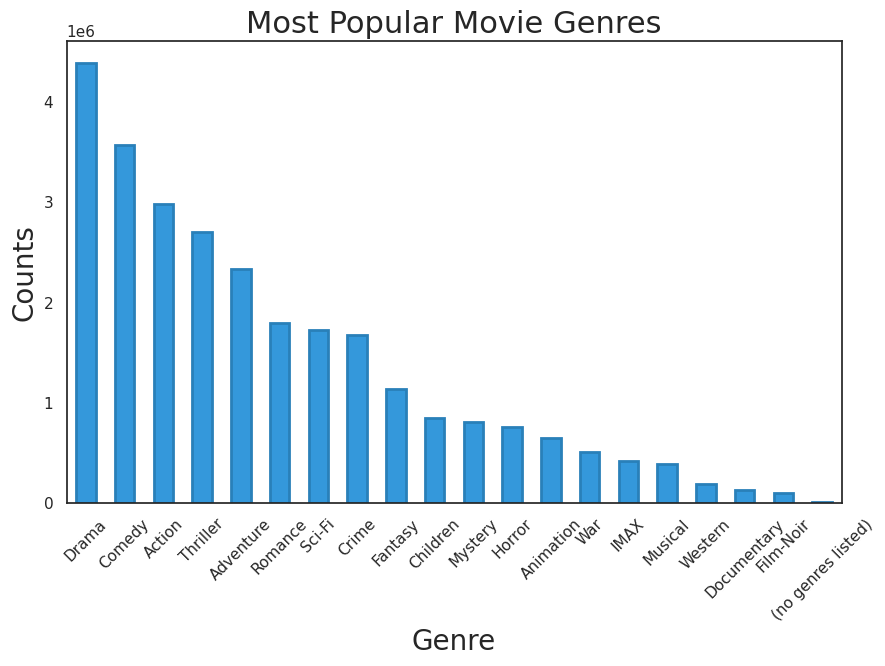

In [38]:
def make_bar_chart(dataset, attribute, title='Title', xlab='X', ylab='Y'):
    counts = dataset[attribute].value_counts()
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_title(title, fontsize=22)
    ax.set_xlabel(xlab, fontsize=20)
    ax.set_ylabel(ylab, fontsize=20)
    
    counts.plot(kind='bar', color='#3498db', edgecolor='#2980b9', linewidth=2)
    
    plt.xticks(rotation=45)
    plt.show()
    
make_bar_chart(genres, 'Genre', title='Most Popular Movie Genres', xlab='Genre', ylab='Counts')


* The most popular genre is drama.
* The top 5 most popular genres are drama, comedy, action, thriller andadventure.

In [39]:
# calculate ratings by genre
genre_ratings = {} # create an empty dictionary to store the genre ratings

for _, row in new_df.iterrows(): # iterate through each row in the dataset
    for genre in row['genres'].split('|'): # split the genres by '|'
        if genre in genre_ratings: # check if the genre exists in the genre_ratings dictionary
            genre_ratings[genre].append(row['rating']) # if it exists, append the rating to the genre's ratings list
        else:
            genre_ratings[genre] = [row['rating']] # if it doesn't exist, create a new entry with the genre as key and a list containing the rating as value

In [40]:
genre_list = [] # an empty list to store genres
rating_list = [] # an empty list to stoe average ratings

for genre, ratings in genre_ratings.items(): # iterate through each genre and its ratings in the genre_ratings dictionary
    genre_list.append(genre) # append the genre to the genre list
    rating_list.append(sum(ratings) / len(ratings)) # calculate the average rating and append it to the rating list

In [41]:
genres_with_ratings = pd.DataFrame({'Genre': genre_list, 'Mean_Rating': rating_list})

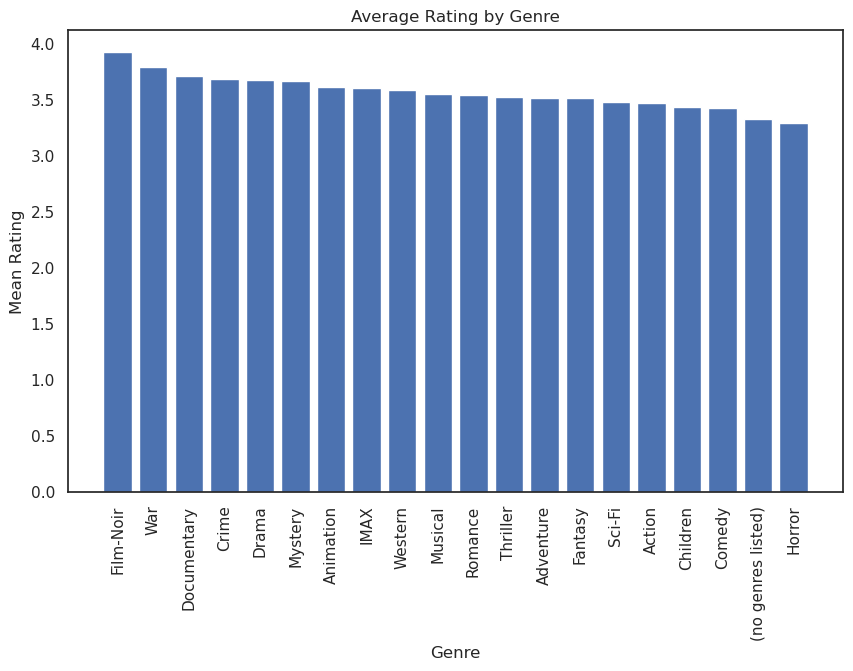

In [42]:
# Sort the DataFrame by Mean_Rating in descending order
genres_with_ratings.sort_values('Mean_Rating', ascending=False, inplace=True)

# Plotting the average rating by genre
plt.figure(figsize=(10, 6))
plt.bar(genres_with_ratings['Genre'], genres_with_ratings['Mean_Rating'])
plt.xlabel('Genre')
plt.ylabel('Mean Rating')
plt.title('Average Rating by Genre')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility if needed
plt.show()

* Film-Noir performed better than all the other genres.
* Wholistically, all genres performed well, averaging at 3 and above.

### Explore Genome Data

In [43]:
# merge the genome scores and tags dataframes
genome_data = pd.merge(left = genome_scores, right = genome_tags, on = 'tagId')

In [44]:
# an overview of the merged datasets
genome_data.head()

,movieId,tagId,relevance,tag
0,1,1,0.02875,007
1,2,1,0.04125,007
2,3,1,0.04675,007
3,4,1,0.03425,007
4,5,1,0.04300,007


In [45]:
# check for null values
genome_data.isnull().sum()

movieId      0
tagId        0
relevance    0
tag          0
dtype: int64

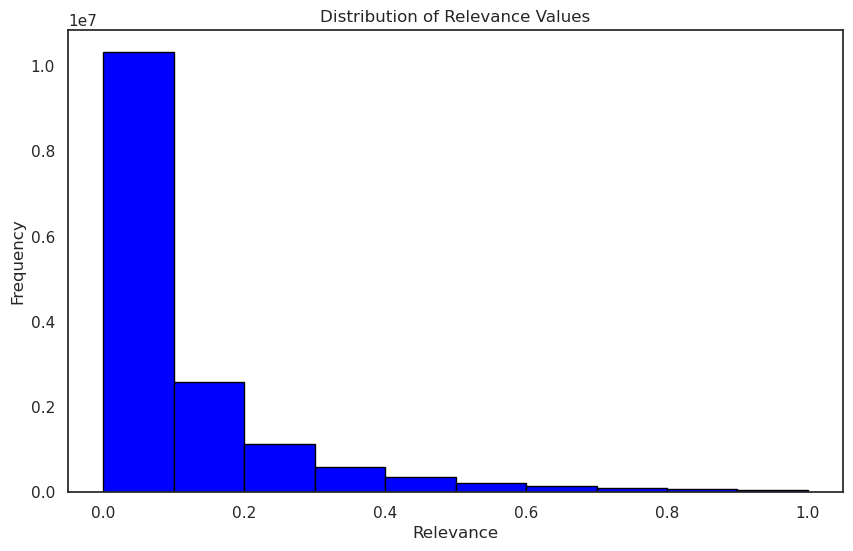

In [46]:
# Histogram: Plot the distribution of relevance values
plt.figure(figsize=(10, 6))
plt.hist(genome_data['relevance'], bins=10, color='blue', edgecolor='black')
plt.xlabel('Relevance')
plt.ylabel('Frequency')
plt.title('Distribution of Relevance Values')
plt.show()

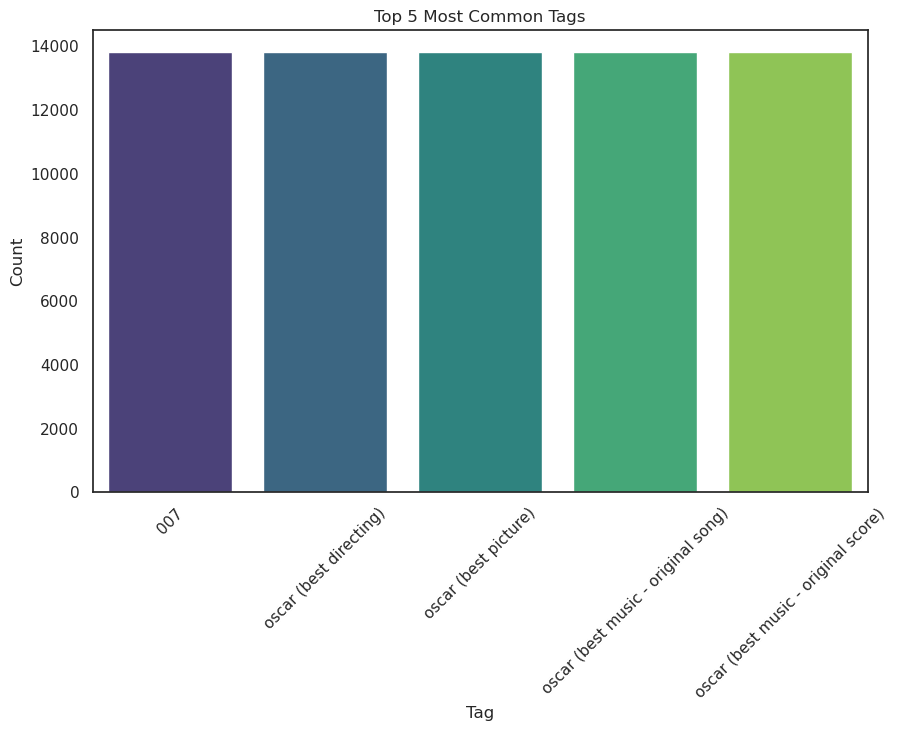

In [47]:
# Bar Chart: Plot the top N most common tags based on their occurrence in the dataset
top_n_tags = 5
top_tags = genome_data['tag'].value_counts().nlargest(top_n_tags)

plt.figure(figsize=(10, 6))
sns.barplot(x=top_tags.index, y=top_tags.values, palette='viridis')
plt.xlabel('Tag')
plt.ylabel('Count')
plt.title(f'Top {top_n_tags} Most Common Tags')
plt.xticks(rotation=45)
plt.show()

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
| In this section, we will clean and rearrange the dataset. |

---

# Data preprocessing

We will utilise three popular techniques used for dimensionality reduction and visualisation. These techniques are used to transform high-dimensional data into lower-dimensional representations while preserving the structure of the data.

## 1. Multidimensional Scaling

When the distance between pairs of items is known, the technique known as multidimensional scaling (MDS) can be used to visualize the distances between the objects on a map.

## 2. t-sne
There are two primary steps in the t-SNE algorithm. First, t-SNE builds a probability distribution across pairs of high-dimensional objects in such a way that picking comparable objects is more likely than picking dissimilar points, which is exceedingly unlikely.

Second, t-SNE minimizes the Kullback-Leibler divergence between the two distributions with regard to the positions of the points in the map and defines a similar probability distribution over the points in the low-dimensional map. While the original approach bases its similarity metric on the Euclidean distance between objects, this should be adjusted as necessary.

- We will begin the preprocessing by standardising the data:

In [48]:
# Subset the data to cut down computation time
genome_score = genome_scores_df[:10000000]

In [49]:
# Create a StandardScaler object to scale the data
scaler_mds = StandardScaler()

# Sample a fraction of the genome_score data
sampled_genome = genome_score.sample(frac=0.0001)

# Scale the sampled data using the StandardScaler
mds_genome = scaler_mds.fit_transform(sampled_genome)

In [50]:
# Create a TSNE object with specified parameters
tsne = TSNE(n_components=2, n_jobs=-1, verbose=2, perplexity=10, learning_rate=0.1)

In [51]:
# Fit the t-SNE model to the preprocessed data
tsne.fit(mds_genome)

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.020s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.067662
[t-SNE] Computed conditional probabilities in 0.017s
[t-SNE] Iteration 50: error = 84.5763245, gradient norm = 0.0002161 (50 iterations in 0.232s)
[t-SNE] Iteration 100: error = 84.5763245, gradient norm = 0.0007421 (50 iterations in 0.119s)
[t-SNE] Iteration 150: error = 84.5763092, gradient norm = 0.0028323 (50 iterations in 0.121s)
[t-SNE] Iteration 200: error = 84.5761414, gradient norm = 0.0138937 (50 iterations in 0.108s)
[t-SNE] Iteration 250: error = 84.5710907, gradient norm = 0.0914518 (50 iterations in 0.107s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.571091
[t-SNE] Iteration 300: error = 4.5619326, gradient norm = 0.0322050 (50 iterations in 0.100s)
[t-SNE] Iteration 350: error = 4.5477509, gradient norm = 0.22249

TSNE(learning_rate=0.1, n_jobs=-1, perplexity=10, verbose=2)

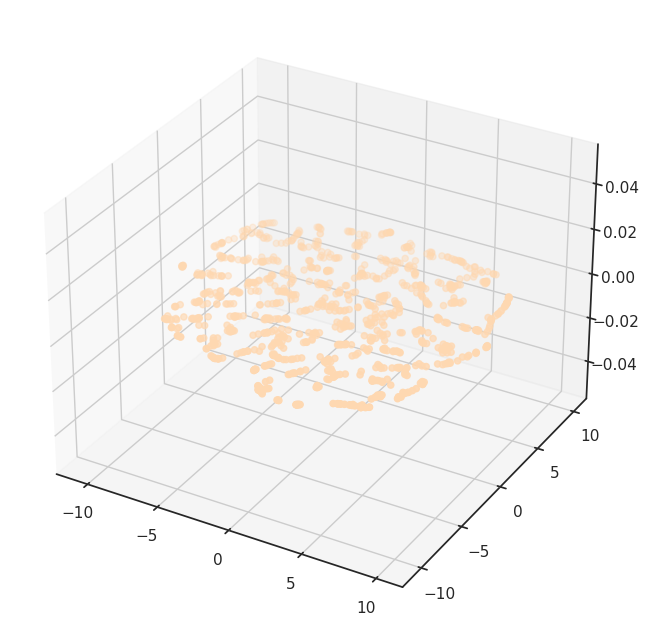

In [52]:
#a scatter plot in 3D using the t-SNE embeddings.

# Create a new figure with a specified size
fig = plt.figure(figsize=(15, 8))

# Add a 3D scatter plot
ax = fig.add_subplot(projection='3d')
ax.scatter(tsne.embedding_[:, 0], tsne.embedding_[:, 1], color='#ffd8b1')

# Show the plot
plt.show()

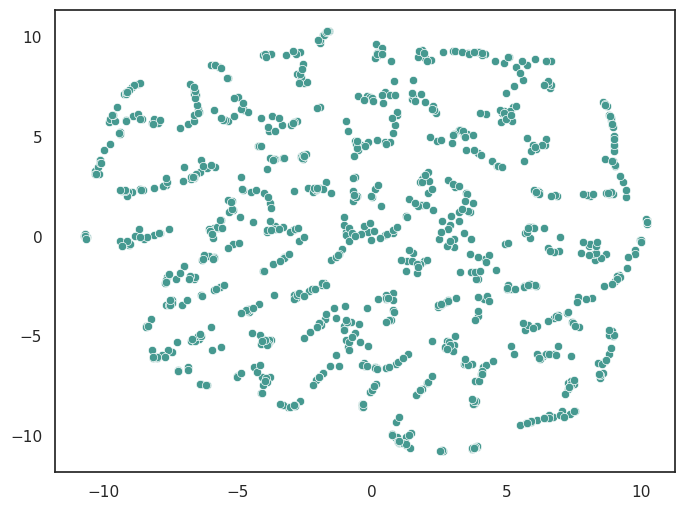

In [53]:
#t-SNE embeddings in a scatter plot using Seaborn

# Create a new figure with a specified size
fig = plt.figure(figsize=(8, 6))

# Create a scatter plot using seaborn
sns.scatterplot(x=tsne.embedding_[:, 0], y=tsne.embedding_[:, 1],color='#469990')

# Show the plot
plt.show()

## 3. Principal Component Analysis

A method for lowering the dimensionality of such datasets, improving interpretability while minimizing information loss is principal component analysis (PCA). It accomplishes this by producing fresh, uncorrelated variables that maximize variance one after the other.

In [54]:
def pivot_(df):
    """
    Pivots table.
    """
    # Create a dictionary with 'movieId' as keys, sorted in ascending order
    new_dict = {'movieId': sorted(set(df.index))}
    
    # Create a new DataFrame using the dictionary
    pivoted = pd.DataFrame(new_dict)
    
    # Get unique 'tagId' values and sort them
    tagids = sorted(set(df['tagId']))
    
    # Iterate over each 'tagId'
    for Id in range(len(tagids)):
        # Get the 'relevance' values where 'tagId' matches the current Id
        relevances = list(df[df['tagId'] == Id + 1]['relevance'])
        
        # Add the relevances to the pivoted DataFrame as a new column
        pivoted[f'{Id + 1}'] = relevances
    
    # Return the pivoted DataFrame
    return pivoted

In [55]:
# Use the pivot_ function to pivot the genome_scores DataFrame and set 'movieId' as the index
pca_data_pivoted = pivot_(genome_scores_df).set_index('movieId')

In [56]:
pca_data_pivoted.shape

(13816, 1128)

* Lets make this more readable.

In [57]:
pca_data_pivoted.columns = list(genome_tags_df['tag'])

In [58]:
pca_data_pivoted.head()

,007,007 (series),18th century,1920s,1930s,1950s,1960s,1970s,1980s,19th century,3d,70mm,80s,9/11,aardman,aardman studios,abortion,absurd,...,wistful,witch,witches,witty,wizards,women,working class,workplace,world politics,world war i,world war ii,writer's life,writers,writing,wuxia,wwii,zombie,zombies
movieId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.02875,0.02375,0.06250,0.07575,0.14075,0.14675,0.06350,0.20375,0.2020,0.03075,0.58025,0.10250,0.20175,0.00700,0.02450,0.17275,0.01650,0.10400,...,0.07150,0.03325,0.10550,0.69400,0.10800,0.08925,0.05500,0.07700,0.04050,0.01425,0.03050,0.03500,0.14125,0.05775,0.03900,0.02975,0.08475,0.02200
2,0.04125,0.04050,0.06275,0.08275,0.09100,0.06125,0.06925,0.09600,0.0765,0.05250,0.08800,0.10275,0.14525,0.00700,0.00450,0.02750,0.01075,0.15925,...,0.02225,0.24300,0.38525,0.18725,0.21700,0.13525,0.01800,0.08725,0.05250,0.01575,0.01250,0.02000,0.12225,0.03275,0.02100,0.01100,0.10525,0.01975
3,0.04675,0.05550,0.02925,0.08700,0.04750,0.04775,0.04600,0.14275,0.0285,0.03875,0.02450,0.06475,0.08100,0.00550,0.00500,0.03475,0.00675,0.11375,...,0.02500,0.01950,0.02950,0.22325,0.02650,0.35075,0.02150,0.07325,0.06275,0.01950,0.02225,0.02300,0.12200,0.03475,0.01700,0.01800,0.09100,0.01775
4,0.03425,0.03800,0.04050,0.03100,0.06500,0.03575,0.02900,0.08650,0.0320,0.03150,0.02800,0.03475,0.07775,0.01325,0.00325,0.02650,0.01875,0.13375,...,0.03850,0.02275,0.03625,0.10725,0.02875,0.97525,0.02075,0.38650,0.05325,0.02800,0.01675,0.03875,0.18200,0.07050,0.01625,0.01425,0.08850,0.01500
5,0.04300,0.05325,0.03800,0.04100,0.05400,0.06725,0.02775,0.07650,0.0215,0.02975,0.02775,0.03300,0.05050,0.00825,0.00300,0.02525,0.01800,0.15475,...,0.03275,0.02450,0.03500,0.10475,0.03350,0.40225,0.01875,0.11200,0.05350,0.02050,0.01425,0.02550,0.19225,0.02675,0.01625,0.01300,0.08700,0.01600


In [59]:
features = [col for col in pca_data_pivoted.columns]

## 4. Scales of measurement

It is important that we scale the data before dimensionality reduction.

Although all variables are measured on the same scale (0-1), there shouldn't be any downside to setting the mean to zero and standard deviation to 1.

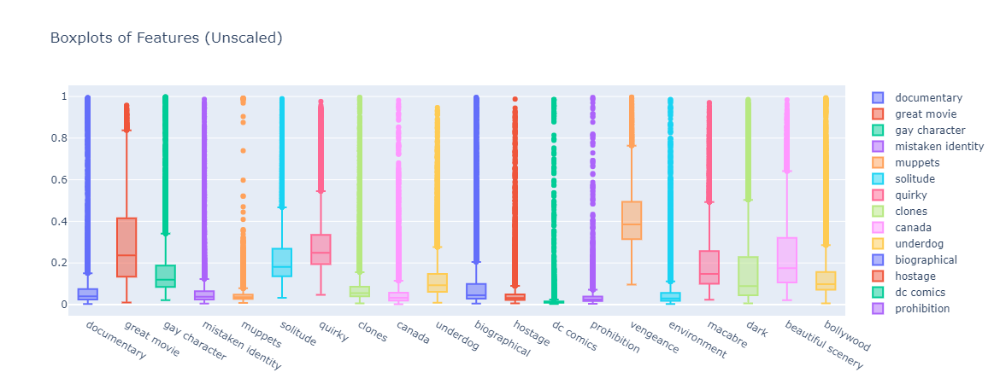

In [60]:
import plotly.offline as pyo
import plotly.graph_objs as go

# Set Plotly to work in offline mode and make the plot world-readable with a white theme
pyo.init_notebook_mode(connected=True)
cf.set_config_file(offline=True, world_readable=True, theme='white')

# Select 20 random columns from the pivoted DataFrame
columns = random.sample(range(0, 1129), 20)

# Create a box plot using Plotly
data = []
for column in pca_data_pivoted.iloc[:, columns]:
    trace = go.Box(y=pca_data_pivoted[column], name=str(column))
    data.append(trace)

layout = go.Layout(title="Boxplots of Features (Unscaled)")

fig = go.Figure(data=data, layout=layout)

# Display the box plot
pyo.iplot(fig)

In [61]:
def scaler(df):
    """
    Scales data.
    """
    # Create a StandardScaler object
    scaler = StandardScaler(with_std=True)
    
    # Scale the data using the StandardScaler object
    scaled_data = scaler.fit_transform(df)
    
    # Return the scaled data
    return scaled_data

In [62]:
# Apply the scaler function to scale the pca_data_pivoted DataFrame
pca_scaled = scaler(pca_data_pivoted)

In [63]:
# Create a new DataFrame using the scaled data, preserving the index and column names
scaled_pca = pd.DataFrame(pca_scaled, index=pca_data_pivoted.index, columns=pca_data_pivoted.columns)

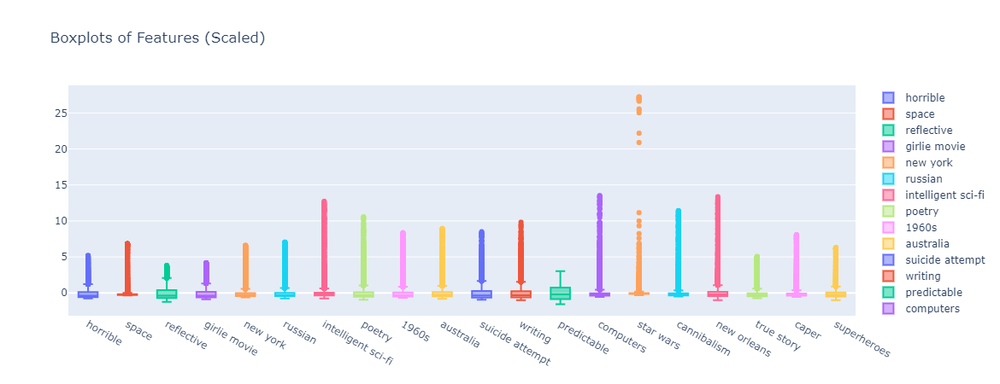

In [64]:
# Set Plotly to work in offline mode and make the plot world-readable with a white theme
pyo.init_notebook_mode(connected=True)
cf.set_config_file(offline=True, world_readable=True, theme='white')

# Select the columns to plot
columns = random.sample(range(0, 1129), 20)

# Create a box plot using Plotly
data = []
for column in scaled_pca.iloc[:, columns]:
    trace = go.Box(y=scaled_pca[column], name=str(column))
    data.append(trace)

layout = go.Layout(title="Boxplots of Features (Scaled)")

fig = go.Figure(data=data, layout=layout)

# Display the box plot
pyo.iplot(fig)

Text(0, 0.5, 'Cumulative explained variance')

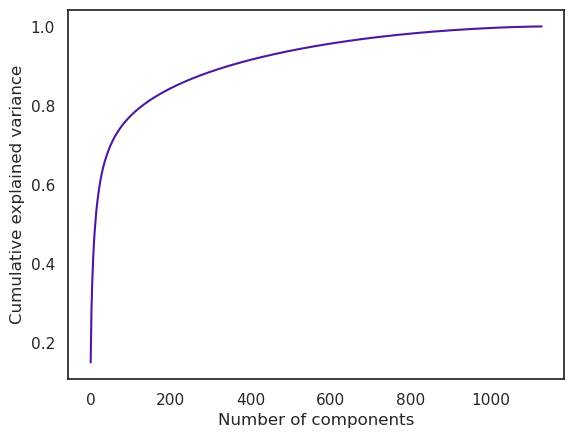

In [65]:
# Define PCA object
pca = PCA()

# Fit the PCA model to our data and apply dimensionality reduction
prin_comp = pca.fit_transform(pca_data_pivoted[features])

# Create a DataFrame containing the principal components
pca_df = pd.DataFrame(data=prin_comp, index=pca_data_pivoted.index, columns=pca_data_pivoted.columns)

# Plot a line graph of cumulative variance explained
plt.plot(np.cumsum(pca.explained_variance_ratio_), color='#4D17A0')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In [66]:
pca_80 = PCA(.80)
pca_80_df = pca_80.fit_transform(pca_data_pivoted)
print(round(pca_80.explained_variance_ratio_.sum()*100, 1),
      "% of variance explained by",
      pca_80.n_components_,
      "components.")

80.0 % of variance explained by 131 components.


Instead of the acute elbow we expected, the cumulative explained variance displays an initially steep, then smooth curve. This can be because the genomes have already been selected as the main elements of films. However, we can observe that 131 components account for 80% of the variance in the movie dataset. In a content-based approach, we should only use these components to maximize computational efficiency.

In [67]:
pca_80_df = pd.DataFrame(pca_80_df, index = pca_data_pivoted.index)
pca_80_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,...,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130
movieId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.796514,2.212839,-2.489444,1.624747,0.984763,1.168046,-0.203300,1.659382,-0.675962,-1.251265,-0.243100,1.458491,0.015197,-0.105688,0.425797,-0.912528,-0.355820,0.061083,...,-0.231842,0.003821,-0.240198,0.011903,-0.108367,-0.012805,0.070784,-0.095150,-0.166531,0.023522,0.124865,0.091553,-0.014734,-0.082235,0.029796,-0.077556,-0.072878,-0.094931
2,-1.541922,1.597864,-1.113613,1.302526,-0.196336,0.191809,-0.026161,1.208987,-0.369388,-0.483199,-0.226106,0.961881,-0.430214,-0.317001,-0.010892,0.299261,0.480117,-0.256093,...,-0.196130,-0.029274,0.129477,-0.080385,0.130292,0.078674,-0.034200,-0.104279,0.026369,-0.088038,0.113610,-0.050569,-0.015265,0.067904,0.026488,0.013665,0.079228,-0.130822
3,-1.506092,-0.010220,-0.605981,-0.316252,0.330972,0.334078,0.048253,0.010072,-0.042318,0.040345,0.191281,-0.182988,0.521585,-0.003704,-0.114366,-0.146336,-0.050823,0.019156,...,0.015790,-0.087111,-0.047043,0.147395,0.119151,-0.023542,-0.020572,0.151601,0.060794,-0.101178,0.033077,0.073228,-0.010904,-0.094919,0.019864,0.004834,0.059739,0.035608
4,-1.293604,-0.775662,-0.926582,-0.384600,0.103713,-0.345682,0.683775,0.218370,-0.159426,0.639183,0.406253,0.030442,-0.023683,-0.391013,0.194688,-0.379045,0.480997,0.083958,...,-0.036413,0.000460,0.121817,0.058174,-0.007047,0.057493,0.031200,0.016132,-0.036119,-0.145511,0.102927,-0.103027,0.005975,0.053953,0.044405,-0.202070,-0.158430,0.007054
5,-1.694557,-0.185986,-1.204239,-0.149549,0.470713,0.053199,0.385026,0.302557,-0.133082,-0.083749,0.364581,0.121228,0.940859,-0.199978,0.237478,-0.157197,-0.015649,-0.142857,...,-0.014334,-0.049426,-0.023443,-0.025480,0.180352,-0.231177,-0.075608,0.112447,0.016023,0.069098,-0.017486,0.005937,0.127657,-0.019529,-0.327449,-0.137680,-0.053703,0.065995


<a id="five"></a>
## 5. Modelling and Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
| In this section, we will create machine learning models to make predictions. |

---

To reduce computation time, we train and evaluate the following models on a 100k subset of the data. The best performing model will be trained on the whole dataset to predict the ratings for the final submission file.

In [68]:
# Load the 100k dataset
#train.drop('timestamp', axis=1, inplace=True)
train_subset = train[:100000]
reader = Reader(rating_scale=(train_subset['rating'].min(), train_subset['rating'].max()))
data = Dataset.load_from_df(train_subset[['userId', 'movieId', 'rating']], reader)
trainset, testset = train_test_split(data, test_size=.25, random_state=42)

## Collaborative Filtering

Collaborative filtering is a technique that can filter out items that a user might like on the basis of reactions by similar users. It works by searching a large group of people and finding a smaller set of users with tastes similar to a particular user.

### 1. Normal Predictor

The Normal Predictor algorithm predicts a random rating for each movie based on the distribution of the training set, which is assumed to be normal.

In [69]:
np_test = NormalPredictor()
np_test.fit(trainset)
predictions = np_test.test(testset)
# Calculate RMSE
np_rmse = accuracy.rmse(predictions)

RMSE: 1.4427


### 2. BaselineOnly

The Baseline Only algorithm predicts the baseline estimate for a given user and movie. A baseline is calculated using either Stochastic Gradient Descent (SGD) or Alternating Least Squares (ALS).

In [70]:
bsl_options = {'method': 'sgd','n_epochs': 40}
blo_test = BaselineOnly(bsl_options=bsl_options)
blo_test.fit(trainset)
predictions = blo_test.test(testset)
# Calculate RMSE
blo_rmse = accuracy.rmse(predictions)

Estimating biases using sgd...
RMSE: 0.9735


### 3. NMF

NMF is a collaborative filtering algorithm based on Non-negative Matrix Factorization. The optimization procedure is a (regularized) stochastic gradient descent with a specific choice of step size that ensures non-negativity of factors, provided that their initial values are also positive.

In [71]:
nmf_test = NMF()
nmf_test.fit(trainset)
predictions = nmf_test.test(testset)
# Calculate RMSE
nmf_rmse = accuracy.rmse(predictions)

RMSE: 1.1631


### 4. SlopeOne

The SlopeOne algorithm is a simple yet accurate collaborative filtering algorithm that uses a simple linear regression model to solve the data sparisity problem.

In [72]:
slo_test = SlopeOne()
slo_test.fit(trainset)
predictions = slo_test.test(testset)
# Calculate RMSE
slo_rmse = accuracy.rmse(predictions)

RMSE: 1.1598


### 5. CoClustering

The Co-clustering algorithm assigns clusters using a straightforward optimization method, much like k-means.

In [73]:
cc_test = CoClustering(random_state=42)
cc_test.fit(trainset)
predictions = cc_test.test(testset)
# Calculate RMSE
cc_rmse = accuracy.rmse(predictions)

RMSE: 1.1514


### 6. SVD

The Singular Value Decomposition algorithm is a matrix factorization technique which reduces the number of features of a dataset and was popularized by Simon Funk during the Neflix Prize contest. In the matrix structure, each row represents a user and each column represents a movie. The matrix elements are ratings that are given to movies by users

In [74]:
svd_test = SVD(n_epochs = 30, n_factors = 200, init_std_dev = 0.05, random_state=42)
svd_test.fit(trainset)
predictions = svd_test.test(testset)
# Calculate RMSE
svd_rmse = accuracy.rmse(predictions)

RMSE: 0.9746


An RMSE value of 0.97 indicates that, on average, the SVD model's predictions differ from the actual values by approximately 0.97 units. A RMSE of 0.97 is considered reasonably decent for many applications.

## Content-based Filtering

Content-based filtering, also referred to as cognitive filtering, recommends items based on a comparison between the content of the items and a user profile. The content of each item is represented as a set of descriptors or terms, typically the words that occur in a document. In the following section, the model uses genres as keywords to recommend similar movies based on input from a user. The model was not used to predict ratings for the testing data, as it is too computationally expensive.

In [75]:
def data_preprocessing(subset_size):
    """Prepare data for use within Content filtering algorithm.

    Parameters
    ----------
    subset_size : int
        Number of movies to use within the algorithm.

    Returns
    -------
    Pandas Dataframe
        Subset of movies selected for content-based filtering.

    """
    # Split genre data into individual words.
    movies['keyWords'] = movies['genres'].str.replace('|', ' ')
    # Subset of the data
    movies_subset = movies[:subset_size]
    return movies_subset

In [76]:
def content_model(movie_list,top_n=10): 
    """Performs Content filtering based upon a list of movies supplied
       by the app user.

    Parameters
    ----------
    movie_list : list (str)
        Favorite movies chosen by the app user.
    top_n : type
        Number of top recommendations to return to the user.

    Returns
    -------
    list (str)
        Titles of the top-n movie recommendations to the user.

    """
    # Initializing the empty list of recommended movies
    data = data_preprocessing(2000)
     # Instantiating and generating the count matrix
    count_vec = CountVectorizer()
    count_matrix = count_vec.fit_transform(data['keyWords'])
    indices = pd.Series(data['title'])
    cosine_sim = cosine_similarity(count_matrix, count_matrix)
    cosine_sim = pd.DataFrame(cosine_sim, index = data.index, columns = data.index)
    # Getting the index of the movie that matches the title
    idx_1 = indices[indices == movie_list[0]].index[0]
    idx_2 = indices[indices == movie_list[1]].index[0]
    idx_3 = indices[indices == movie_list[2]].index[0]
    # Creating a Series with the similarity scores in descending order
    rank_1 = cosine_sim[idx_1]
    rank_2 = cosine_sim[idx_2]
    rank_3 = cosine_sim[idx_3]
    # Calculating the scores
    score_series_1 = pd.Series(rank_1).sort_values(ascending = False)
    score_series_2 = pd.Series(rank_2).sort_values(ascending = False)
    score_series_3 = pd.Series(rank_3).sort_values(ascending = False)
    # Getting the indexes of the 10 most similar movies
    listings = score_series_1.append(score_series_2).append(score_series_3).sort_values(ascending = False)
    # Store movie names
    recommended_movies = []
    # Appending the names of movies
    top_50_indexes = list(listings.iloc[1:50].index)
    # Removing chosen movies
    top_indexes = np.setdiff1d(top_50_indexes,[idx_1,idx_2,idx_3])
    for i in top_indexes[:top_n]:
        recommended_movies.append(list(movies['title'])[i])
    return recommended_movies

In [77]:
movies = movies_df.dropna()
movie_list = ['Grumpier Old Men (1995)','Ace Ventura: When Nature Calls (1995)','Father of the Bride Part II (1995)']
content_model(movie_list,top_n=10)

['Living in Oblivion (1995)',
 'Love & Human Remains (1993)',
 'Reckless (1995)',
 'Unstrung Heroes (1995)',
 'Boys on the Side (1995)',
 'Miracle on 34th Street (1994)',
 'Secret of Roan Inish, The (1994)',
 'Virtuosity (1995)',
 'Beverly Hillbillies, The (1993)',
 'Blue Chips (1994)']

<a id="seven"></a>
## 6. Model Evaluation
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---

| In this section, we will compare the models and choose the best performing model based on the RMSE. |

---

We built and tested six different collaborative filtering models and compared their performance using a statistical measure known as the root mean squared error (RMSE), which determines the average squared difference between the estimated values and the actual value. A low RMSE value indicates high model accuracy.

## 1. Root Mean Squared Error (RMSE):

Root Mean Squared Error (RMSE) is a commonly used metric in statistics and machine learning to measure the accuracy of predictions or model performance. It quantifies the average difference between predicted values and actual values in a dataset by taking the square root of the mean of the squared differences. RMSE is a measure of how well a model approximates or predicts the actual values, and lower RMSE values indicate better performance.

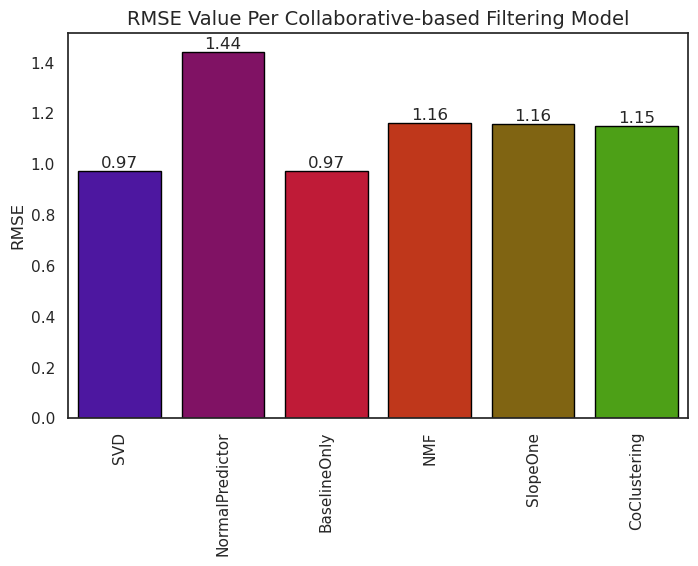

In [78]:
# Compare RMSE values between models
fig,axis = plt.subplots(figsize=(8, 5))
rmse_x = ['SVD','NormalPredictor','BaselineOnly','NMF','SlopeOne','CoClustering']
rmse_y = [svd_rmse,np_rmse,blo_rmse,nmf_rmse,slo_rmse,cc_rmse]
ax = sns.barplot(x=rmse_x, y=rmse_y,palette='brg',edgecolor='black')
plt.title('RMSE Value Per Collaborative-based Filtering Model',fontsize=14)
plt.xticks(rotation=90)
plt.ylabel('RMSE')
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2, p.get_y() + p.get_height(), round(p.get_height(),2), fontsize=12, ha="center", va='bottom')
    
plt.show()

### Model Comparisons

#### SVD (Singular Value Decomposition) = 0.97:
SVD has achieved a competitive RMSE of 0.97. It is a popular matrix factorization-based collaborative filtering algorithm that can capture latent factors in the data, making it suitable for personalized recommendations. SVD generally performs well and is widely used in various recommendation systems.

#### NormalPredictor = 1.43:
NormalPredictor, with an RMSE of 1.43, is a simplistic baseline algorithm. It does not take into account any user or item information, which limits its accuracy. While it can provide a straightforward starting point for recommendation systems, it may not deliver high-quality personalized recommendations.

#### BaselineOnly = 0.97:
BaselineOnly achieved the same RMSE as SVD (0.97). It is a basic algorithm that estimates predictions based on user and item baselines. Given its competitive performance, simplicity, and efficiency, BaselineOnly is a good candidate for recommendation systems.

#### NMF (Non-negative Matrix Factorization) = 1.16:
NMF has an RMSE of 1.16, which is slightly worse than SVD and BaselineOnly but still reasonable. NMF enforces non-negativity constraints on its factorization, which can be beneficial for interpretability, but it might not always outperform SVD.

#### SlopeOne = 1.16:
SlopeOne also achieved an RMSE of 1.16, the same as NMF. SlopeOne is known for its efficiency and simplicity. While it may not be the most accurate algorithm, it can still provide decent recommendations and is computationally lightweight.

#### Coclustering = 1.15:
Coclustering achieved the lowest RMSE of 1.15, indicating good accuracy. However, it's worth noting that coclustering can be computationally more expensive compared to some other algorithms, especially for larger datasets.

#### Recommendation:

Based on the RMSE comparisons and considering the various factors for a movie recommender system, the following recommendations can be made:

Top Choice: SVD or BaselineOnly would be excellent top choices. Both algorithms achieved an RMSE of 0.97, indicating competitive performance and are known for their effectiveness in recommendation systems.

Alternate Choices: NMF and SlopeOne are also reasonable alternatives with RMSE values of 1.16. They are computationally efficient and can provide decent recommendations.

Coclustering: While Coclustering achieved the lowest RMSE of 1.15, it might be less practical for larger datasets due to its computational cost. Unless computational efficiency is not a major concern, it can be considered as an option for accurate recommendations.

## 2. Cross Validation

Cross validation is a technique used to test the accuracy of a model's prediction on unseen data (validation sets). This is important because it can assist in picking up issues such as over/underfitting and selection bias. We used the K-fold technique to perform cross validation on our two best perfoming models, i.e. SVD and BaselineOnly.

* ###  SVD

In [79]:
svd_test = SVD(n_epochs = 40, n_factors = 200, init_std_dev = 0.05, random_state=42)
# Run 5-fold cross-validation and print results
a = cross_validate(svd_test, data, measures=['RMSE'], cv=5, verbose=True)

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9721  0.9687  0.9642  0.9685  0.9697  0.9686  0.0026  
Fit time          4.10    4.47    4.50    4.70    4.60    4.48    0.20    
Test time         0.16    0.17    0.16    0.16    0.15    0.16    0.01    


* ### BaselineOnly

In [80]:
bsl_options = {'method': 'sgd','n_epochs': 40}
blo_test = BaselineOnly(bsl_options=bsl_options)
# Run 5-fold cross-validation and print results
b = cross_validate(blo_test, data, measures=['RMSE'], cv=5, verbose=True)

Estimating biases using sgd...
Estimating biases using sgd...
Estimating biases using sgd...
Estimating biases using sgd...
Estimating biases using sgd...
Evaluating RMSE of algorithm BaselineOnly on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9739  0.9650  0.9696  0.9646  0.9662  0.9679  0.0035  
Fit time          2.18    2.17    2.35    2.46    2.37    2.31    0.11    
Test time         0.11    0.12    0.13    0.11    0.12    0.12    0.01    


## 3. Model Analysis

In [81]:
# Load the 100k dataset
train_subset = train[:100000]
reader = Reader(rating_scale=(train_subset['rating'].min(), train_subset['rating'].max()))
data = Dataset.load_from_df(train_subset[['userId', 'movieId', 'rating']], reader)
trainset, testset = train_test_split(data, test_size=.25, random_state=42)

## 4. Hyperparameter Tuning

Hyperparameter tuning is the process by which a set of ideal hyperparameters are chosen for a model. A hyperparameter is a parameter for which the value is set manually and tuned to control the algorithm's learning process. We tested multiple parameters for our best performing model (i.e. SVD).

In [82]:
param_grid = {'n_epochs':[40], #[30,40,50],
              'n_factors':[400], #[100,200,300,400],
              'init_std_dev':[0.005], #[0.001,0.005,0.05,0.1],
              'random_state':[42]} 
grid_SVD = GridSearchCV(SVD, cv=5, measures=['rmse'], param_grid=param_grid, n_jobs=-1)
grid_SVD.fit(data)
print('***Best score:***')
print(grid_SVD.best_score['rmse'])
print('***Best parameters:***')
print(grid_SVD.best_params['rmse'])

***Best score:***
0.9690885442126076
***Best parameters:***
{'n_epochs': 40, 'n_factors': 400, 'init_std_dev': 0.005, 'random_state': 42}


A model with 40 epochs, 400 latent factors, an initial standard deviation of 0.005, and a random state of 42 performed best in terms of RSME.

With these hyperparameters, the SVD model achieved an RMSE of approximately 0.967, which is a reasonable performance for a movie recommender system.

## 4. Results

In [83]:
svd_test = SVD(n_epochs = 40, n_factors = 400, init_std_dev = 0.005, random_state=42)
svd_test.fit(trainset)
predictions = svd_test.test(testset)
# Calculate RMSE
svd_rmse = accuracy.rmse(predictions)

RMSE: 0.9734


After training the SVD model with the specified hyperparameters (n_epochs = 40, n_factors = 400, init_std_dev = 0.005, random_state = 42) on the training set and making predictions on the test set, the calculated RMSE on the test set is approximately 0.9734.

This means that, on average, the predictions made by the SVD model on the test set are off by approximately 0.9734 units from the actual ratings. While the RMSE of 0.9734 is slightly higher than the best score obtained during the hyperparameter tuning (0.9667), it is still within a reasonable range for a movie recommender system.

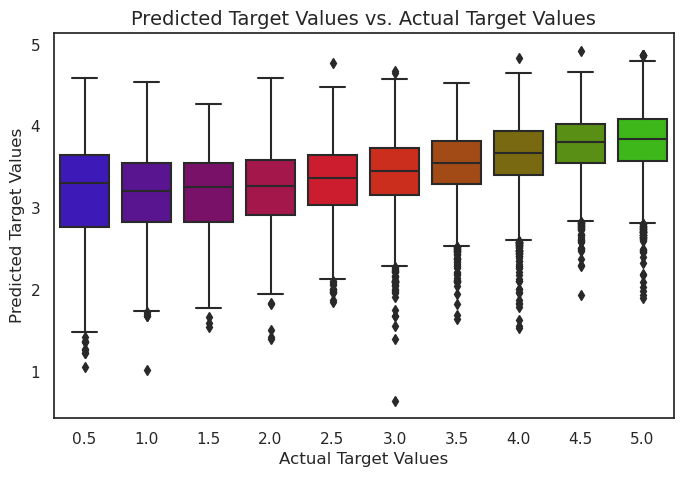

In [84]:
# Predicted Target Values vs. Actual Target Values
new_df = pd.DataFrame(columns=['uid', 'iid', 'rating'])
i = 0
for (uid, iid, rating) in testset:
    new_df.loc[i] = [uid, iid, rating]
    i = i+1
true = new_df['rating']
pred = []
for i in predictions:
    pred.append(i.est)
fig,axis = plt.subplots(figsize=(8, 5))
sns.boxplot(x=true, y=pred, palette="brg")
plt.title("Predicted Target Values vs. Actual Target Values", fontsize=14)
plt.xlabel("Actual Target Values")
plt.ylabel("Predicted Target Values")
plt.show()

<a id="one"></a>
## 7. Conclusion
<a href=#cont>Back to Table of Contents</a>


In this project, we were successful in creating an unsupervised machine learning model that can effectively predict how a user will score a movie they have not yet seen based on their past preferences and can propose movies based on content-based or collaborative filtering. Based on a testing set submitted to the EDSA Kaggle competition, our best-performing model has a root mean squared error (RMSE) of 0.97. A foundational method for recommender systems is the singular value decomposition (SVD) algorithm, which has a wide range of uses, including dimensionality reduction, the resolution of linear inverse problems, and data fitting. Since the SVD approach divides a matrix into constituent arrays of feature vectors corresponding to each row and each column, it typically outperforms several other models on large datasets.

# Save Output

In [85]:
# Train model on whole dataset
reader = Reader(rating_scale=(train['rating'].min(), train['rating'].max()))
data = Dataset.load_from_df(train[['userId', 'movieId', 'rating']], reader)
trainset = data.build_full_trainset()
svd = SVD(n_epochs = 40, n_factors = 400, init_std_dev = 0.005, random_state=42, verbose=True)
svd.fit(trainset)

# Create Kaggle submission file
predictions = []
for i, row in test.iterrows():
    x = (svd.predict(row.userId, row.movieId))
    pred = x[3]
    predictions.append(pred)
test['Id'] = test['userId'].map(str) +'_'+ test['movieId'].map(str)
results = pd.DataFrame({"Id":test['Id'],"rating": predictions})
results.to_csv("Team-ES2_submission.csv", index=False)
print("Done!")

Processing epoch 0
Processing epoch 1
Processing epoch 2
Processing epoch 3
Processing epoch 4
Processing epoch 5
Processing epoch 6
Processing epoch 7
Processing epoch 8
Processing epoch 9
Processing epoch 10
Processing epoch 11
Processing epoch 12
Processing epoch 13
Processing epoch 14
Processing epoch 15
Processing epoch 16
Processing epoch 17
Processing epoch 18
Processing epoch 19
Processing epoch 20
Processing epoch 21
Processing epoch 22
Processing epoch 23
Processing epoch 24
Processing epoch 25
Processing epoch 26
Processing epoch 27
Processing epoch 28
Processing epoch 29
Processing epoch 30
Processing epoch 31
Processing epoch 32
Processing epoch 33
Processing epoch 34
Processing epoch 35
Processing epoch 36
Processing epoch 37
Processing epoch 38
Processing epoch 39
Done!


In [86]:
experiment.end()

COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     url                   : https://www.comet.com/mati9210/recommender-systems/00789137f87d4d3296ff04a1c72c82e8
COMET INFO:   Parameters:
COMET INFO:     algorithm               : auto
COMET INFO:     angle                   : 0.5
COMET INFO:     copy                    : True
COMET INFO:     early_exaggeration      : 12.0
COMET INFO:     init                    : pca
COMET INFO:     leaf_size               : 30
COMET INFO:     learning_rate           : 0.1
COMET INFO:     method                  : barnes_hut
COMET INFO:     metric                  : euclidean
COMET INFO:     metric_params           : 1
COMET INFO:     min_grad_norm           : 1e-07
COMET INFO:     n_component

<a id="one"></a>
## 8. References
<a href=#cont>Back to Table of Contents</a>


Baptiste Rocca. (2019). Introduction to recommender systems. Towards Data Science. https://towardsdatascience.com/introduction-to-recommender-systems-6c66cf15ada. (Accessed July 06, 2023).

Mmatlou Matlakala.([2023]). EDA for recommender systems: A serach on OpenAI.OpenAI.https://openai.com/search.(Accessed July, 2023).

Carsten. 2020. You can use is_unique. Stack Overflow. https://stackoverflow.com/questions/50242968/check-for-duplicate-values-in-pandas-dataframe-column. (Accessed July 12, 2023).

tusharbhadak. How to combine two dataframe in Python – Pandas?GeeksForGeeks. https://www.geeksforgeeks.org/how-to-combine-two-dataframe-in-python-pandas/. (Accessed July 12, 2023).